**sign in with colab & Connect with google drive**

In [1]:
from google.colab import drive
drive.mount('/content/gdrive')
!ln -s /content/gdrive/MyDrive
!ls MyDrive

Mounted at /content/gdrive
'Colab Notebooks'   NVIDIA-SM


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


**CUDA: Let's check that Nvidia CUDA drivers are already pre-installed and which version is it.**

In [ ]:
!/usr/local/cuda/bin/nvcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2020 NVIDIA Corporation
Built on Wed_Jul_22_19:09:09_PDT_2020
Cuda compilation tools, release 11.0, V11.0.221
Build cuda_11.0_bu.TC445_37.28845127_0


In [ ]:
!nvidia-smi

Sat Sep 11 09:14:53 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.63.01    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   55C    P8    30W / 149W |      0MiB / 11441MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [3]:
!pwd

/content


**going inside NVIDIA-SM folder**

In [7]:
%cd MyDrive/NVIDIA-SM

/content/gdrive/MyDrive/NVIDIA-SM


**Unziping train and test images uploaded in the drive**

In [ ]:
#!unzip test.zip
#!unzip background.zip -d /content/drive/MyDrive/NVIDIA-SM/training
#!unzip hi.zip -d /content/drive/MyDrive/NVIDIA-SM/training

**making env**

In [ ]:
%env compute_capability=60

env: compute_capability=60


## DATA ANALYSIS

In [8]:
import cv2
import numpy as np
import os
import random
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

### loading test images

In [ ]:
path = './test'
test_images = []
PicList = os.listdir(path)
for x in PicList:
  img = cv2.imread(path+'/'+x)
  test_images.append(img)
print('Size of test images  :',test_images[0].shape)
print('Number of test images:',len(test_images))

Size of test images  : (64, 64, 3)
Number of test images: 98


### filtering & comparing different scaled images

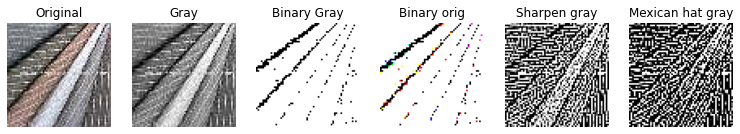

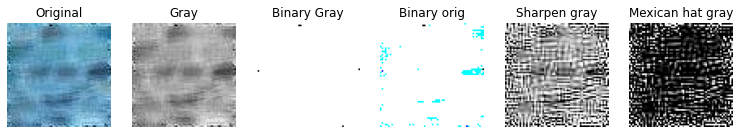

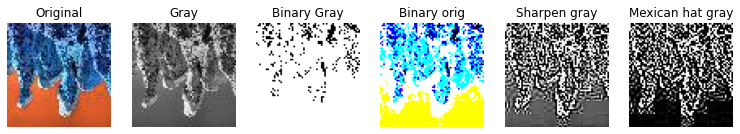

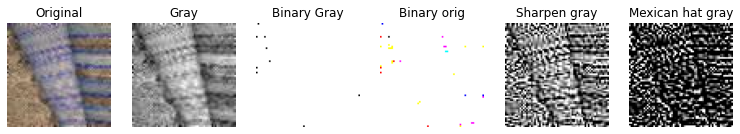

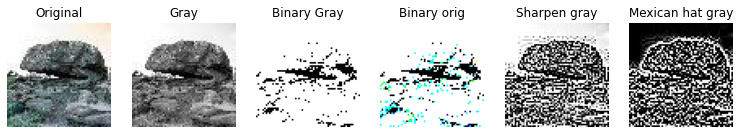

...

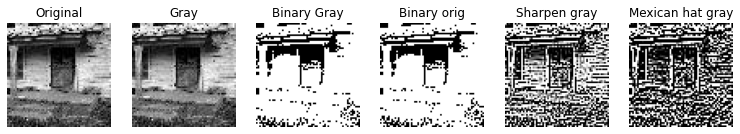

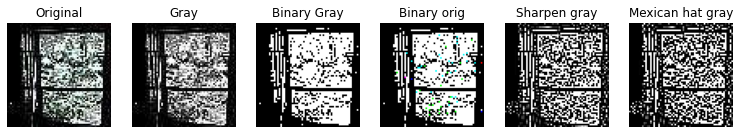

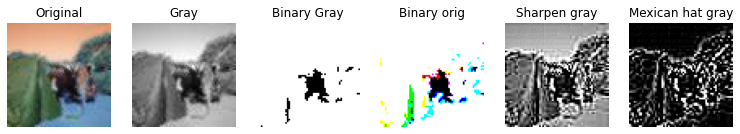

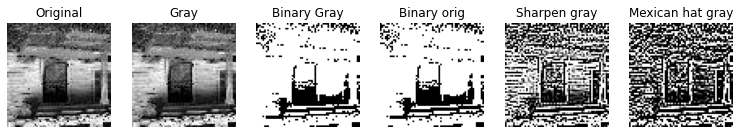

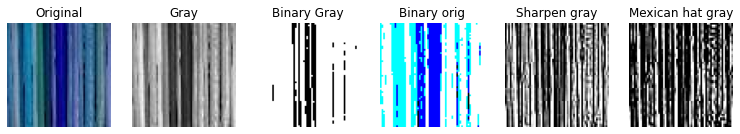

In [ ]:
filter = np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]])
filter1 = np.array([[0,0,-1,0,0],[0,-1,-2,-1,0],[-1,-2,16,-2,-1],[0,-1,-2,-1,0],[0,0,-1,0,0]])
for i in range(98):
  f,(ax1,ax2,ax3,ax4,ax5,ax6) = plt.subplots(1,6,figsize=(13,2))
  img = test_images[i]
  gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
  _,bw = cv2.threshold(gray,50,255,cv2.THRESH_BINARY)
  _,bw1 = cv2.threshold(img,50,255,cv2.THRESH_BINARY)  
  sharpimg = cv2.filter2D(gray,-1,filter)
  mexhatimg=cv2.filter2D(gray,-1,filter1)
  
  ax1.imshow(img)
  ax2.imshow(gray, cmap='gray')
  ax3.imshow(bw, cmap='gray')
  ax4.imshow(bw1)
  ax5.imshow(sharpimg, cmap='gray')
  ax6.imshow(mexhatimg, cmap='gray')
 
  ax1.set_title("Original")
  ax2.set_title("Gray")
  ax3.set_title("Binary Gray")
  ax4.set_title("Binary orig")
  ax5.set_title("Sharpen gray")
  ax6.set_title("Mexican hat gray")

  ax1.set_axis_off()
  ax2.set_axis_off()
  ax3.set_axis_off()
  ax4.set_axis_off()
  ax5.set_axis_off()
  ax6.set_axis_off()

**conclusion:-**
**comparing six different scaled images we find gray images are better to identify blurr devnagary scripts**

**deleting test images and loading gray-test-images**

In [ ]:
del test_images

In [9]:
path = './test'
gray_test_images = []
PicList = os.listdir(path)
for x in PicList:
  img = cv2.imread(path+'/'+x,cv2.IMREAD_GRAYSCALE)
  gray_test_images.append(img)
print('Size of Gray test images  :',gray_test_images[0].shape)
print('Number of Gray test images:',len(gray_test_images))

Size of Gray test images  : (64, 64)
Number of Gray test images: 98


 Few Geay test Images are...



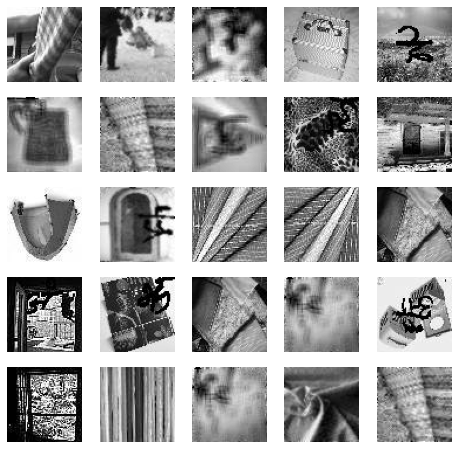

In [10]:
print(' Few Geay test Images are...\n')
fig, axes = plt.subplots( 5,5,figsize = (8,8))
for row in axes:
    for axe in row:
        index = np.random.randint(len(gray_test_images))
        axe.imshow(gray_test_images[index], cmap='gray')
        axe.set_axis_off()

### Making gray train images

In [ ]:
!mkdir train
!mkdir train/background
!mkdir train/hi

**My all Folders are...**

In [ ]:
!ls

kaggle	Models	outputs  test  train  training


#### Background Gray images are loaded and saved

In [11]:
pth = './training/background'
bc_Gray_images = []
PicList = os.listdir(pth)
for x in PicList:
  gray = cv2.imread(pth+'/'+x,cv2.IMREAD_GRAYSCALE)
  cv2.imwrite(f'./train/background/{x}',gray)
  bc_Gray_images.append(gray)
print("No. of background images :",len(bc_Gray_images))
print(f"{len(bc_Gray_images)} background Gray images are saved")

No. of background images : 4450
4450 background Gray images are saved


 Few Gray background images...



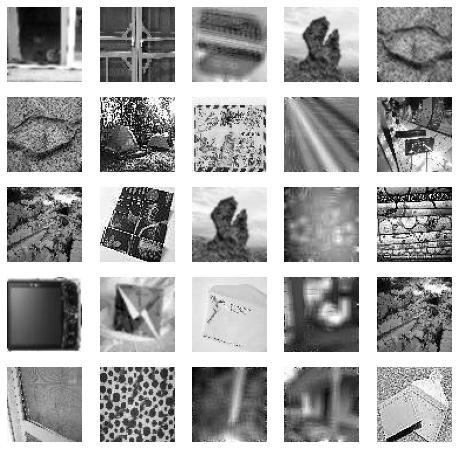

In [12]:
print(' Few Gray background images...\n')
fig, axes = plt.subplots( 5,5,figsize = (8,8))
for row in axes:
    for axe in row:
        index = np.random.randint(len(bc_Gray_images))
        axe.imshow(bc_Gray_images[index], cmap='gray')
        axe.set_axis_off()

### loading and saving 'hi' train gray images 

In [13]:
pth = './training/hi'
Hi_Gray_images = []
PicList = os.listdir(pth)
for x in PicList:
  gray = cv2.imread(pth+'/'+x,cv2.IMREAD_GRAYSCALE)
  cv2.imwrite(f'./train/hi/{x}',gray)
  Hi_Gray_images.append(gray)
print("No. of hi images loaded:",len(Hi_Gray_images))
print(f"{len(Hi_Gray_images)} number hi Gray images are saved....")

No. of hi images loaded: 1425
1425 number hi Gray images are saved....


 Few Gray Hi images...



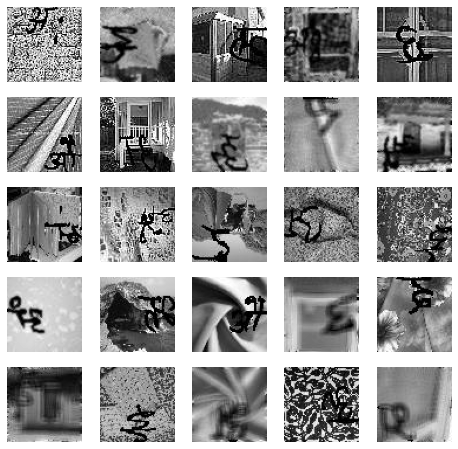

In [14]:
print(' Few Gray Hi images...\n')
fig, axes = plt.subplots( 5,5,figsize = (8,8))
for row in axes:
    for axe in row:
        index = np.random.randint(len(Hi_Gray_images))
        axe.imshow(Hi_Gray_images[index], cmap='gray')
        axe.set_axis_off()

### loading some devnagari-kaggle images

In [ ]:
#!unzip /content/drive/MyDrive/NVIDIA-SM/kaggle.zip

In [15]:
image_lst = os.listdir('./kaggle')
kaggle_gray_images = []
for i in image_lst:
  gr = cv2.imread('./kaggle/'+i, cv2.IMREAD_GRAYSCALE)
  kaggle_gray_images.append(gr)

print("No. of kaggle devnagari images :",len(kaggle_gray_images))

No. of kaggle devnagari images : 666


 size of kaggle-devnagari images: (28, 28)
 Few Gray kaggle-devnagari images...



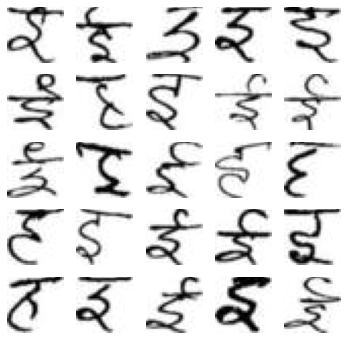

In [17]:
print(' size of kaggle-devnagari images:',kaggle_gray_images[0].shape)
print(' Few Gray kaggle-devnagari images...\n')
fig, axes = plt.subplots( 5,5,figsize = (6,6))
for row in axes:
    for axe in row:
        index = np.random.randint(len(kaggle_gray_images))
        axe.imshow(kaggle_gray_images[index], cmap='gray')
        axe.set_axis_off()

### Creating some 'hi' train data from kaggle-devanagari and saving it in gray scale

In [ ]:
for i in range(len(kaggle_gray_images)): 
  dst = cv2.addWeighted(cv2.copyMakeBorder(kaggle_gray_images[i],24, 12, 22, 14, cv2.BORDER_CONSTANT, (0,0,0)), 0.30, bc_Gray_images[i], 0.7,0)
  cv2.imwrite(f'./train/hi/{i}.jpg',dst)

In [ ]:
print("size of created hi images: ",dst.shape)

size of created hi images:  (64, 64)


 Few train Generated hi Images are...



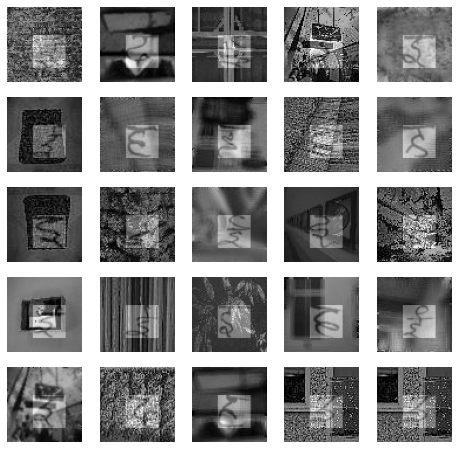

In [18]:
print(' Few train Generated hi Images are...\n')
fig, axes = plt.subplots( 5,5,figsize = (8,8))
for row in axes:
    for axe in row:
        index = np.random.randint(len(kaggle_gray_images))
        axe.imshow(cv2.imread(f'./train/hi/{index}.jpg'), cmap='gray')
        axe.set_axis_off()

### Mixed Gray Hi images after generating kaggle-images

In [20]:
pat = './train/hi'
gray_hi_images = []
PicList = os.listdir(pat)
for x in PicList:
  gray1 = cv2.imread(pat+'/'+x)
  gray_hi_images.append(gray1)

print(" NO. of gray hi images :",len(gray_hi_images))

 NO. of gray hi images : 2091
 NO. of gray hi images : 2091


Few gray mixed hi images...


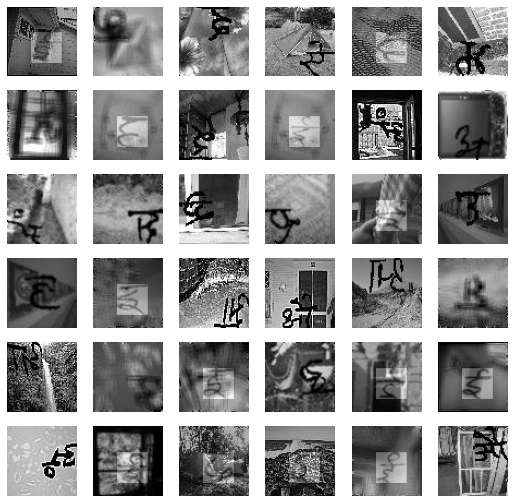

In [24]:
fig, axes = plt.subplots( 6,6,figsize = (9,9))
for row in axes:
    for axe in row:
        index = np.random.randint(len(gray_hi_images))
        axe.imshow(gray_hi_images[index], cmap='gray')
        axe.set_axis_off()
print("Few gray mixed hi images...")

In [25]:
del bc_Gray_images, kaggle_gray_images, gray_hi_images

### processing and preparing training data



In [27]:
path = './train'
count = 0
images = []
classNo = []
label = os.listdir(path)
No_of_class = len(label)

print("Labels are:-",label)

Labels are:- ['hi', 'background']


In [28]:
for x in label:
  PicList = os.listdir(path+'/'+x)
  for y in PicList:
      curImg = cv2.imread(path+'/'+x+'/'+y, cv2.IMREAD_GRAYSCALE)
      images.append(curImg)
      classNo.append(count)
  count+=1
    
print("NO. of Classes :",No_of_class)

NO. of Classes : 2


In [ ]:
print("Shape of the images: ",images[0].shape)

Shape of the images:  (64, 64)


**making numpy array**

In [32]:
train_image = np.array(images).copy()
classNo = np.array(classNo).copy()

In [ ]:
del images

In [ ]:
print("size of train images: ",train_image.shape)

size of train images:  (6541, 64, 64)


In [30]:
from keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

### Making train test split

In [33]:
xtrain,x_val,ytrain,y_val = train_test_split(train_image,classNo,test_size=0.2,stratify=classNo)

In [34]:
print("DATA DISTRIBUTION:-")
print("Train Sets      :",len(ytrain))
print("Validation Sets :",len(y_val))

DATA DISTRIBUTION:-
Train Sets      : 5232
Validation Sets : 1309


 DATA DISTRIBUTION...



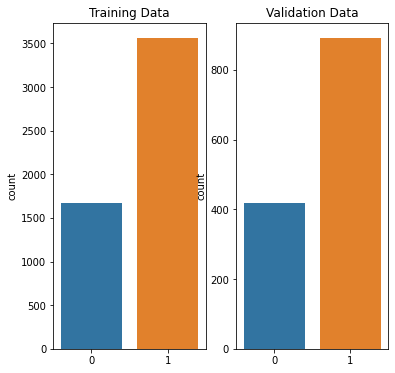

In [35]:
print(" DATA DISTRIBUTION...\n")
f,(ax1,ax2) = plt.subplots(1,2,figsize=(6,6))
sns.countplot(ytrain,ax=ax1)
ax1.set_title("Training Data")
sns.countplot(y_val,ax=ax2)
ax2.set_title("Validation Data")
plt.show()

In [ ]:
label

['hi', 'background']

In [ ]:
print(f" train data shape     : {xtrain.shape} \n validation data shape: {x_val.shape}")

 train data shape     : (5232, 64, 64) 
 validation data shape: (1309, 64, 64)


### pre-processing datasets for training

In [ ]:
def equalize(img):
    img = cv2.equalizeHist(img)
    return img

def preprossesing(img):
    img = equalize(img)
    img = img/255
    return img

In [ ]:
test_images = np.array(gray_test_images).copy()
Xtest = np.array(list(map(preprossesing,test_images)))
Xtest = Xtest.reshape(-1,64,64,1)
Xtest.shape

(98, 64, 64, 1)

In [ ]:
Xtrain = np.array(list(map(preprossesing,xtrain)))
X_val = np.array(list(map(preprossesing,x_val))) 

### adding depth to the images for training & evaluation

In [ ]:
Xtrain = Xtrain.reshape(-1,64,64,1)
X_val = X_val.reshape(-1,64,64,1)
Xtrain.shape, X_val.shape,

((5232, 64, 64, 1), (1309, 64, 64, 1))

### importing libraries

In [ ]:
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.utils.np_utils import to_categorical
from keras.optimizers import adam_v2
from keras.layers.convolutional import Conv2D, MaxPooling2D
import h5py
import random

### Making categorical label

In [ ]:
No_of_class = 2
y_train = to_categorical(ytrain,No_of_class)
y_val = to_categorical(y_val,No_of_class)

In [ ]:
y_train[0]

array([1., 0.], dtype=float32)

### Making LeNet like cnn model

In [ ]:
def Model():
    model = Sequential()
    ### Conv layers
    model.add(Conv2D(60,kernel_size=5,input_shape=(64,64,1),activation='relu'))
    model.add(Conv2D(60,kernel_size=5,activation='relu'))
    model.add(MaxPooling2D(2,2))
    model.add(Conv2D(30,kernel_size=3,activation='relu'))
    model.add(Conv2D(30,kernel_size=3,activation='relu'))
    model.add(MaxPooling2D(2,2))
    model.add(Dropout(0.5))
    ### Dense layers
    model.add(Flatten())
    model.add(Dense(256,activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(128,activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(2,activation='softmax'))
    ###Compiling Model
    model.compile(loss='categorical_crossentropy',metrics=['accuracy'])
    return model

In [ ]:
model = Model()
model.summary()

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_28 (Conv2D)           (None, 60, 60, 60)        1560      
_________________________________________________________________
conv2d_29 (Conv2D)           (None, 56, 56, 60)        90060     
_________________________________________________________________
max_pooling2d_14 (MaxPooling (None, 28, 28, 60)        0         
_________________________________________________________________
conv2d_30 (Conv2D)           (None, 26, 26, 30)        16230     
_________________________________________________________________
conv2d_31 (Conv2D)           (None, 24, 24, 30)        8130      
_________________________________________________________________
max_pooling2d_15 (MaxPooling (None, 12, 12, 30)        0         
_________________________________________________________________
dropout_14 (Dropout)         (None, 12, 12, 30)       

### Start Training with 20 epochs initially

In [ ]:
epochs = 20
hist = model.fit(x=Xtrain,y=y_train,batch_size=32,
                 epochs=epochs,validation_data=(X_val,y_val),
                 shuffle=True,initial_epoch=0,steps_per_epoch=None,)


Epoch 1/20
164/164 [==============================] - 279s 2s/step - loss: 0.5977 - accuracy: 0.7045 - val_loss: 0.9438 - val_accuracy: 0.6944
Epoch 2/20
164/164 [==============================] - 280s 2s/step - loss: 0.3812 - accuracy: 0.8547 - val_loss: 0.3160 - val_accuracy: 0.8717
Epoch 3/20
164/164 [==============================] - 278s 2s/step - loss: 0.2797 - accuracy: 0.9027 - val_loss: 0.1928 - val_accuracy: 0.9267
Epoch 4/20
164/164 [==============================] - 278s 2s/step - loss: 0.2321 - accuracy: 0.9279 - val_loss: 0.1887 - val_accuracy: 0.9465
Epoch 5/20
164/164 [==============================] - 280s 2s/step - loss: 0.2436 - accuracy: 0.9318 - val_loss: 0.1007 - val_accuracy: 0.9679
Epoch 6/20
164/164 [==============================] - 279s 2s/step - loss: 0.1662 - accuracy: 0.9469 - val_loss: 0.1927 - val_accuracy: 0.9244
Epoch 7/20
164/164 [==============================] - 278s 2s/step - loss: 0.1553 - accuracy: 0.9534 - val_loss: 0.0971 - val_accuracy: 0.9710

### Running 5 epochs more for better results

In [ ]:
epochs = 25
hist1 = model.fit(x=Xtrain,y=y_train,batch_size=32,
                 epochs=epochs,validation_data=(X_val,y_val),
                 shuffle=True,initial_epoch=20,steps_per_epoch=None,)

Epoch 21/25
164/164 [==============================] - 279s 2s/step - loss: 0.0902 - accuracy: 0.9788 - val_loss: 0.3645 - val_accuracy: 0.9404
Epoch 22/25
164/164 [==============================] - 280s 2s/step - loss: 0.1021 - accuracy: 0.9748 - val_loss: 0.0864 - val_accuracy: 0.9786
Epoch 23/25
164/164 [==============================] - 280s 2s/step - loss: 0.1066 - accuracy: 0.9746 - val_loss: 0.0906 - val_accuracy: 0.9771
Epoch 24/25
164/164 [==============================] - 279s 2s/step - loss: 0.0998 - accuracy: 0.9767 - val_loss: 0.5511 - val_accuracy: 0.9358
Epoch 25/25
164/164 [==============================] - 278s 2s/step - loss: 0.0980 - accuracy: 0.9761 - val_loss: 0.0628 - val_accuracy: 0.9832


**evaluating score**

In [ ]:
score = model.evaluate(X_val,y_val,verbose=0)

### Results

In [ ]:
print('Total validation sample       :',len(y_val))
print('Accuracy with validation Data :',round(score[1]*100,2),'%')
print('Loss with validation Data     :',round(score[0],3))

Total validation sample       : 1309
Accuracy with validation Data : 98.32 %
Loss with validation Data     : 0.063


In [ ]:
valLoss = hist.history['val_loss'] + hist1.history['val_loss']
loss = hist.history['loss'] + hist1.history['loss']
accu = hist.history['accuracy'] + hist1.history['accuracy']
val_acc = hist.history['val_accuracy'] + hist1.history['val_accuracy']

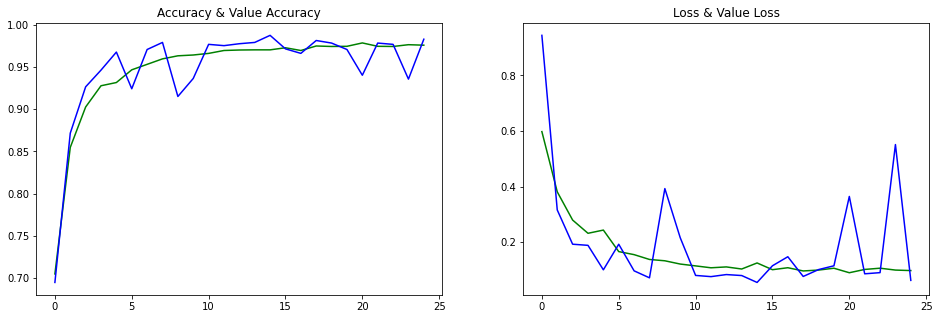

In [ ]:
f,(ax1,ax2) = plt.subplots(1,2,figsize=(16,5))
ax1.plot(np.arange(epochs),accu,color='g')
ax1.plot(np.arange(epochs),val_acc,color='b')
ax1.set_title('Accuracy & Value Accuracy')
ax2.plot(np.arange(epochs),loss,color='g')
ax2.plot(np.arange(epochs),valLoss,color='b')
ax2.set_title('Loss & Value Loss')
sns.set_style('darkgrid')
plt.show()

### Saving model

In [ ]:
!mkdir Models

In [ ]:
model.save('Models/LeNet_model.h5')

In [ ]:
from keras.models import load_model
model = load_model('Models/LeNet_model.h5')

In [ ]:
label

['background', 'hi']

### predicting for test data of index: 20

In [ ]:
pred = np.argmax(model.predict(Xtest[20].reshape(-1,64,64,1)))
label[pred]

'hi'

### evaluating test predictions

In [ ]:
test_predictions = model.predict(Xtest)

In [ ]:
y_test = []
for i in range(len(test_predictions)):
  p = np.argmax(test_predictions[i])
  nm = label[p]
  y_test.append(nm)

In [ ]:
path = './test'
test_images = []
PicList = os.listdir(path)
for x in PicList:
  img = cv2.imread(path+'/'+x)
  test_images.append(img)
print('Size of test images  :',test_images[0].shape)
print('Number of test images:',len(test_images))

Size of test images  : (64, 64, 3)
Number of test images: 98


In [ ]:
def results(image_list, result_list):
    res = {}
    for i in range(len(image_list)):
        res[image_list[i]] = result_list[i]
    return res


res = results(PicList, y_test)

In [ ]:
!mkdir outputs

In [ ]:
import json
def write_json(file):
    jsonString = json.dumps(file)
    jsonFile = open("output.json", "w")
    jsonFile.write(jsonString)
    jsonFile.close()
    
write_json(res)

## Making InceptionNet model for training

In [ ]:
from keras import layers
from keras.models import Model
from functools import partial

In [ ]:
conv1x1 = partial(layers.Conv2D, kernel_size=1, activation='relu')
conv3x3 = partial(layers.Conv2D, kernel_size=3, padding='same', activation='relu')
conv5x5 = partial(layers.Conv2D, kernel_size=5, padding='same', activation='relu')

def inception_module(in_tensor, c1, c3_1, c3, c5_1, c5, pp):
    conv1 = conv1x1(c1)(in_tensor)

    conv3_1 = conv1x1(c3_1)(in_tensor)
    conv3 = conv3x3(c3)(conv3_1)

    conv5_1 = conv1x1(c5_1)(in_tensor)
    conv5 = conv5x5(c5)(conv5_1)

    pool_conv = conv1x1(pp)(in_tensor)
    pool = layers.MaxPool2D(3, strides=1, padding='same')(pool_conv)

    merged = layers.Concatenate(axis=-1)([conv1, conv3, conv5, pool])
    return merged

def aux_clf(in_tensor):
    avg_pool = layers.AvgPool2D(5, 3)(in_tensor)
    conv = conv1x1(128)(avg_pool)
    flattened = layers.Flatten()(conv)
    dense = layers.Dense(1024, activation='relu')(flattened)
    dropout = layers.Dropout(0.7)(dense)
    out = layers.Dense(2, activation='softmax')(dropout)
    return out

def inception_net(in_shape=(64,64,1), n_classes=2, opt='sgd'):
    in_layer = layers.Input(in_shape)

    conv1 = layers.Conv2D(64, 3, strides=2, activation='relu', padding='same')(in_layer)
    pad1 = layers.ZeroPadding2D()(conv1)
    pool2 = layers.MaxPool2D(3, 2)(pad1)
    
    inception3a = inception_module(pool2, 64, 96, 128, 16, 32, 32)
    inception3b = inception_module(inception3a, 128, 128, 192, 32, 96, 64)
    pad3 = layers.ZeroPadding2D()(inception3b)
    pool3 = layers.MaxPool2D(3, 2)(pad3)

    inception4a = inception_module(pool3, 192, 96, 208, 16, 48, 64)
    inception4b = inception_module(inception4a, 160, 112, 224, 24, 64, 64)
    inception4c = inception_module(inception4b, 128, 128, 256, 24, 64, 64)
    inception4d = inception_module(inception4c, 112, 144, 288, 32, 48, 64)
    inception4e = inception_module(inception4d, 256, 160, 320, 32, 128, 128)
    pad4 = layers.ZeroPadding2D()(inception4e)
    pool4 = layers.MaxPool2D(3, 2)(pad4)

    aux_clf1 = aux_clf(inception4a)
    aux_clf2 = aux_clf(inception4d)

    inception5a = inception_module(pool4, 256, 160, 320, 32, 128, 128)
    inception5b = inception_module(inception5a, 384, 192, 384, 48, 128, 128)
    pad5 = layers.ZeroPadding2D()(inception5b)
    pool5 = layers.MaxPool2D(3, 2)(pad5)

    avg_pool = layers.GlobalAvgPool2D()(pool5)
    dropout = layers.Dropout(0.4)(avg_pool)
    preds = layers.Dense(2, activation='softmax')(dropout)

    model = Model(in_layer, [preds, aux_clf1, aux_clf2])
    model.compile(loss="categorical_crossentropy", optimizer=opt,
	              metrics=["accuracy"])
    return model

if __name__ == '__main__':
    model = inception_net()

In [ ]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 64, 64, 1)]  0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 32, 32, 64)   640         input_1[0][0]                    
__________________________________________________________________________________________________
zero_padding2d (ZeroPadding2D)  (None, 34, 34, 64)   0           conv2d[0][0]                     
__________________________________________________________________________________________________
max_pooling2d (MaxPooling2D)    (None, 16, 16, 64)   0           zero_padding2d[0][0]             
______________________________________________________________________________________________

In [ ]:
epochs = 20
hist = model.fit(x=Xtrain,y=y_train,batch_size=32,
                 epochs=epochs,validation_data=(X_val,y_val),
                 shuffle=True,initial_epoch=0,steps_per_epoch=None,)

Epoch 1/20
164/164 [==============================] - 18s 109ms/step - loss: 0.4875 - dense_4_loss: 0.1331 - dense_1_loss: 0.2046 - dense_3_loss: 0.1497 - dense_4_accuracy: 0.9558 - dense_1_accuracy: 0.9260 - dense_3_accuracy: 0.9488 - val_loss: 0.4798 - val_dense_4_loss: 0.1400 - val_dense_1_loss: 0.1915 - val_dense_3_loss: 0.1483 - val_dense_4_accuracy: 0.9503 - val_dense_1_accuracy: 0.9305 - val_dense_3_accuracy: 0.9465
Epoch 2/20
164/164 [==============================] - 18s 108ms/step - loss: 0.4405 - dense_4_loss: 0.1212 - dense_1_loss: 0.1849 - dense_3_loss: 0.1344 - dense_4_accuracy: 0.9620 - dense_1_accuracy: 0.9354 - dense_3_accuracy: 0.9557 - val_loss: 0.7160 - val_dense_4_loss: 0.2044 - val_dense_1_loss: 0.2729 - val_dense_3_loss: 0.2388 - val_dense_4_accuracy: 0.9351 - val_dense_1_accuracy: 0.8999 - val_dense_3_accuracy: 0.9236
Epoch 3/20
164/164 [==============================] - 18s 108ms/step - loss: 0.4462 - dense_4_loss: 0.1235 - dense_1_loss: 0.1854 - dense_3_loss: 

In [ ]:
epochs = 30
hist = model.fit(x=Xtrain,y=y_train,batch_size=32,
                 epochs=epochs,validation_data=(X_val,y_val),
                 shuffle=True,initial_epoch=20,steps_per_epoch=None,)

Epoch 21/30
164/164 [==============================] - 18s 109ms/step - loss: 0.1299 - dense_4_loss: 0.0180 - dense_1_loss: 0.0838 - dense_3_loss: 0.0281 - dense_4_accuracy: 0.9946 - dense_1_accuracy: 0.9715 - dense_3_accuracy: 0.9916 - val_loss: 0.5294 - val_dense_4_loss: 0.1749 - val_dense_1_loss: 0.1284 - val_dense_3_loss: 0.2261 - val_dense_4_accuracy: 0.9404 - val_dense_1_accuracy: 0.9465 - val_dense_3_accuracy: 0.9167
Epoch 22/30
164/164 [==============================] - 18s 108ms/step - loss: 0.1598 - dense_4_loss: 0.0349 - dense_1_loss: 0.0833 - dense_3_loss: 0.0416 - dense_4_accuracy: 0.9906 - dense_1_accuracy: 0.9734 - dense_3_accuracy: 0.9880 - val_loss: 0.2752 - val_dense_4_loss: 0.0949 - val_dense_1_loss: 0.0973 - val_dense_3_loss: 0.0830 - val_dense_4_accuracy: 0.9763 - val_dense_1_accuracy: 0.9687 - val_dense_3_accuracy: 0.9786
Epoch 23/30
164/164 [==============================] - 18s 108ms/step - loss: 0.1542 - dense_4_loss: 0.0338 - dense_1_loss: 0.0813 - dense_3_los

In [ ]:
model.save('Models/inception_30_model.h5')

In [ ]:
epochs = 40
hist = model.fit(x=Xtrain,y=y_train,batch_size=32,
                 epochs=epochs,validation_data=(X_val,y_val),
                 shuffle=True,initial_epoch=30,steps_per_epoch=None,)

Epoch 31/40
164/164 [==============================] - 18s 109ms/step - loss: 0.0569 - dense_4_loss: 0.0041 - dense_1_loss: 0.0459 - dense_3_loss: 0.0069 - dense_4_accuracy: 0.9992 - dense_1_accuracy: 0.9853 - dense_3_accuracy: 0.9985 - val_loss: 0.2890 - val_dense_4_loss: 0.1153 - val_dense_1_loss: 0.0757 - val_dense_3_loss: 0.0981 - val_dense_4_accuracy: 0.9771 - val_dense_1_accuracy: 0.9763 - val_dense_3_accuracy: 0.9786
Epoch 32/40
164/164 [==============================] - 18s 109ms/step - loss: 0.0770 - dense_4_loss: 0.0132 - dense_1_loss: 0.0476 - dense_3_loss: 0.0162 - dense_4_accuracy: 0.9958 - dense_1_accuracy: 0.9845 - dense_3_accuracy: 0.9950 - val_loss: 0.4799 - val_dense_4_loss: 0.1892 - val_dense_1_loss: 0.1284 - val_dense_3_loss: 0.1623 - val_dense_4_accuracy: 0.9649 - val_dense_1_accuracy: 0.9557 - val_dense_3_accuracy: 0.9656
Epoch 33/40
164/164 [==============================] - 18s 109ms/step - loss: 0.0784 - dense_4_loss: 0.0128 - dense_1_loss: 0.0492 - dense_3_los

In [ ]:
model.save('Models/inception_40_model.h5')

In [ ]:
epochs = 50
hist = model.fit(x=Xtrain,y=y_train,batch_size=32,
                 epochs=epochs,validation_data=(X_val,y_val),
                 shuffle=True,initial_epoch=40,steps_per_epoch=None,)

Epoch 41/50
164/164 [==============================] - 18s 110ms/step - loss: 0.0398 - dense_4_loss: 0.0051 - dense_1_loss: 0.0276 - dense_3_loss: 0.0071 - dense_4_accuracy: 0.9987 - dense_1_accuracy: 0.9925 - dense_3_accuracy: 0.9977 - val_loss: 0.2715 - val_dense_4_loss: 0.1010 - val_dense_1_loss: 0.0865 - val_dense_3_loss: 0.0841 - val_dense_4_accuracy: 0.9824 - val_dense_1_accuracy: 0.9748 - val_dense_3_accuracy: 0.9840
Epoch 42/50
164/164 [==============================] - 18s 109ms/step - loss: 0.0329 - dense_4_loss: 0.0045 - dense_1_loss: 0.0233 - dense_3_loss: 0.0052 - dense_4_accuracy: 0.9990 - dense_1_accuracy: 0.9935 - dense_3_accuracy: 0.9989 - val_loss: 0.2488 - val_dense_4_loss: 0.0945 - val_dense_1_loss: 0.0686 - val_dense_3_loss: 0.0857 - val_dense_4_accuracy: 0.9847 - val_dense_1_accuracy: 0.9809 - val_dense_3_accuracy: 0.9832
Epoch 43/50
164/164 [==============================] - 18s 109ms/step - loss: 0.0296 - dense_4_loss: 0.0030 - dense_1_loss: 0.0225 - dense_3_los

In [ ]:
epochs = 60
hist = model.fit(x=Xtrain,y=y_train,batch_size=32,
                 epochs=epochs,validation_data=(X_val,y_val),
                 shuffle=True,initial_epoch=50,steps_per_epoch=None,)

Epoch 51/60
164/164 [==============================] - 18s 110ms/step - loss: 0.0259 - dense_4_loss: 0.0036 - dense_1_loss: 0.0179 - dense_3_loss: 0.0044 - dense_4_accuracy: 0.9990 - dense_1_accuracy: 0.9952 - dense_3_accuracy: 0.9990 - val_loss: 1.4834 - val_dense_4_loss: 0.5494 - val_dense_1_loss: 0.4205 - val_dense_3_loss: 0.5135 - val_dense_4_accuracy: 0.9167 - val_dense_1_accuracy: 0.9114 - val_dense_3_accuracy: 0.9167
Epoch 52/60
164/164 [==============================] - 18s 109ms/step - loss: 0.0302 - dense_4_loss: 0.0061 - dense_1_loss: 0.0185 - dense_3_loss: 0.0055 - dense_4_accuracy: 0.9989 - dense_1_accuracy: 0.9941 - dense_3_accuracy: 0.9990 - val_loss: 0.2434 - val_dense_4_loss: 0.0952 - val_dense_1_loss: 0.0653 - val_dense_3_loss: 0.0829 - val_dense_4_accuracy: 0.9824 - val_dense_1_accuracy: 0.9794 - val_dense_3_accuracy: 0.9824
Epoch 53/60
164/164 [==============================] - 18s 110ms/step - loss: 0.0216 - dense_4_loss: 0.0031 - dense_1_loss: 0.0149 - dense_3_los

In [ ]:
epochs = 75
hist1 = model.fit(x=Xtrain,y=y_train,batch_size=32,
                 epochs=epochs,validation_data=(X_val,y_val),
                 shuffle=True,initial_epoch=60,steps_per_epoch=None,)

Epoch 61/75
164/164 [==============================] - 18s 110ms/step - loss: 0.0151 - dense_4_loss: 0.0026 - dense_1_loss: 0.0095 - dense_3_loss: 0.0029 - dense_4_accuracy: 0.9992 - dense_1_accuracy: 0.9983 - dense_3_accuracy: 0.9992 - val_loss: 0.3570 - val_dense_4_loss: 0.1411 - val_dense_1_loss: 0.0837 - val_dense_3_loss: 0.1321 - val_dense_4_accuracy: 0.9748 - val_dense_1_accuracy: 0.9786 - val_dense_3_accuracy: 0.9740
Epoch 62/75
164/164 [==============================] - 18s 109ms/step - loss: 0.0149 - dense_4_loss: 0.0023 - dense_1_loss: 0.0097 - dense_3_loss: 0.0029 - dense_4_accuracy: 0.9992 - dense_1_accuracy: 0.9975 - dense_3_accuracy: 0.9989 - val_loss: 0.2492 - val_dense_4_loss: 0.0959 - val_dense_1_loss: 0.0684 - val_dense_3_loss: 0.0848 - val_dense_4_accuracy: 0.9847 - val_dense_1_accuracy: 0.9801 - val_dense_3_accuracy: 0.9862
Epoch 63/75
164/164 [==============================] - 18s 109ms/step - loss: 0.0122 - dense_4_loss: 0.0024 - dense_1_loss: 0.0074 - dense_3_los

In [ ]:
model.save('Models/inception_best_model.h5')

I have forgotten to save history for all epochs I trained repeatedly. So, you can get only the plotting of of few last epochs...

In [ ]:
dense_3_val_loss = hist.history['val_dense_3_loss'] + hist1.history['val_dense_3_loss']
dense_3_loss = hist.history['dense_3_loss'] + hist1.history['dense_3_loss']
dense_3_val_acc = hist.history['val_dense_3_accuracy'] + hist1.history['val_dense_3_accuracy']
dense_3_acc = hist.history['dense_3_accuracy'] + hist1.history['dense_3_accuracy']

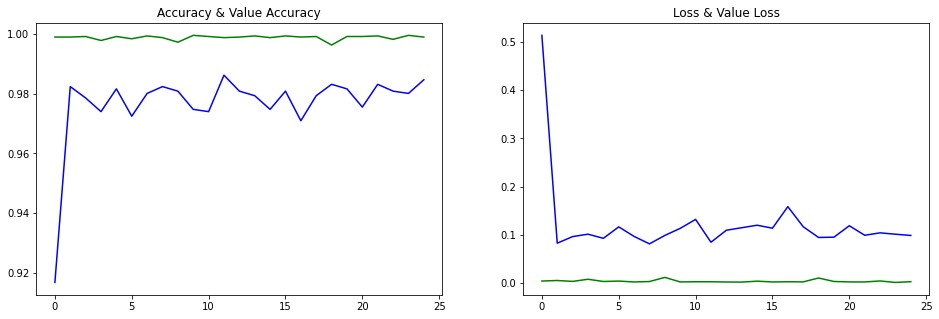

In [ ]:
f,(ax1,ax2) = plt.subplots(1,2,figsize=(16,5))
ax1.plot(np.arange(len(dense_3_loss)),dense_3_acc,color='g')
ax1.plot(np.arange(len(dense_3_loss)),dense_3_val_acc,color='b')
ax1.set_title('Accuracy & Value Accuracy')
ax2.plot(np.arange(len(dense_3_loss)),dense_3_loss,color='g')
ax2.plot(np.arange(len(dense_3_loss)),dense_3_val_loss,color='b')
ax2.set_title('Loss & Value Loss')
sns.set_style('darkgrid')
plt.show()

### loading best model of InceptionNet

In [ ]:
from keras.models import load_model
model = load_model('Models/inception_best_model.h5')

### predicting a test data with 3rd dense layer

In [ ]:
pred = np.argmax(model.predict(Xtest[20].reshape(-1,64,64,1))[2])
label[pred]

'background'

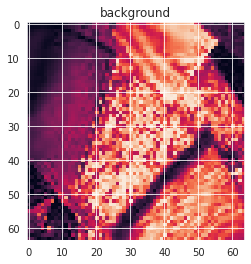

In [ ]:
plt.imshow(Xtest[20].reshape(64,64))
plt.title(label[pred])
plt.show()

### evaluating scores

In [ ]:
score = model.evaluate(X_val,y_val,verbose=0)

In [ ]:
print('Total validation sample       :',len(y_val))
print('Accuracy with validation Data :',round(score[6]*100,2),'%')
print('Loss with validation Data     :',round(score[3],4))

Total validation sample       : 1309
Accuracy with validation Data : 98.47 %
Loss with validation Data     : 0.0989


### loading gray test data for prediction

In [ ]:
test_data = []
test_image_list = []
for i in range(1,99):
  image = cv2.imread(f'test/{i}.jpg',cv2.IMREAD_GRAYSCALE)
  num = f'{i}.jpg'
  test_data.append(image)
  test_image_list.append(num)

### processing test data

In [ ]:
test_images = np.array(test_data).copy()
Xtest = np.array(list(map(preprossesing,test_images)))
Xtest = Xtest.reshape(-1,64,64,1)
Xtest.shape

(98, 64, 64, 1)

In [ ]:
print('Size of test images  :',test_images[0].shape)
print('Number of test images:',len(test_images))

Size of test images  : (64, 64)
Number of test images: 98


### predicting test data with all 3 layers of inception net

In [ ]:
test_predictions1 = model.predict(Xtest)[0] ## for dense output layer_1
test_predictions2 = model.predict(Xtest)[1] ## for dense output layer_2
test_predictions3 = model.predict(Xtest)[2] ## for dense output layer_3

In [ ]:
def predictions(test_predictions):
  y_test = []
  for i in range(len(test_predictions)):
    p = np.argmax(test_predictions[i])
    nm = label[p]
    y_test.append(nm)
  return y_test

### labeling predictions

In [ ]:
y_test1 = predictions(test_predictions1)
y_test2 = predictions(test_predictions2)
y_test3 = predictions(test_predictions3)

### showing predictions with all the 3 output layers of inception net

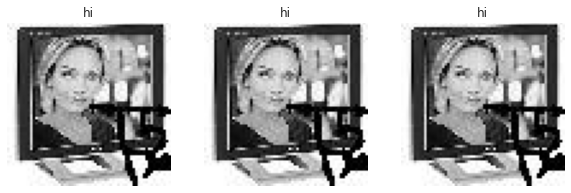

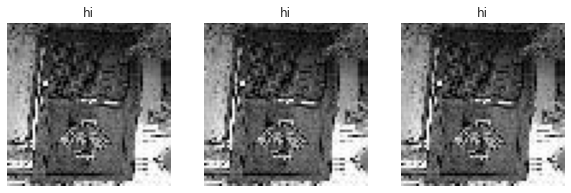

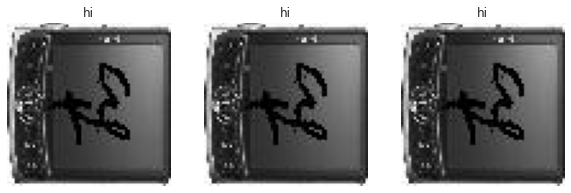

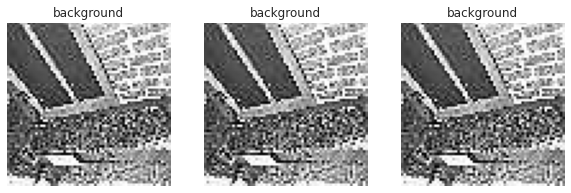

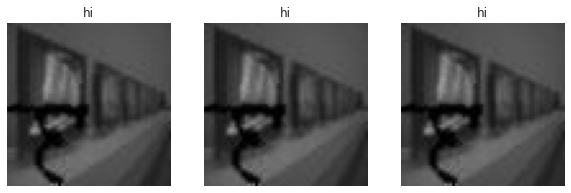

...

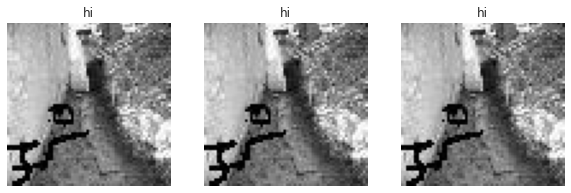

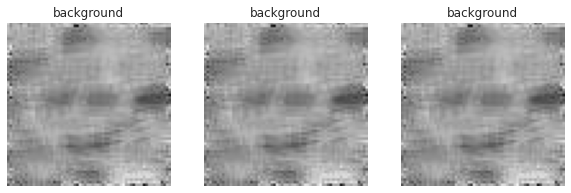

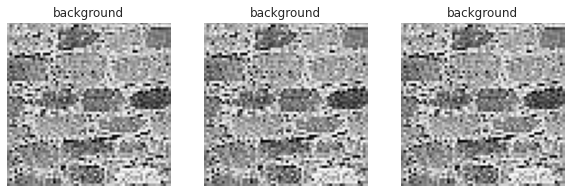

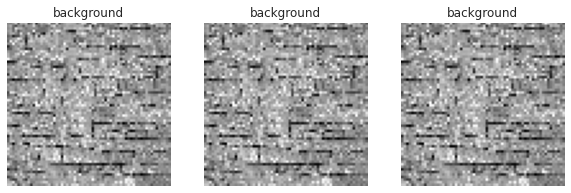

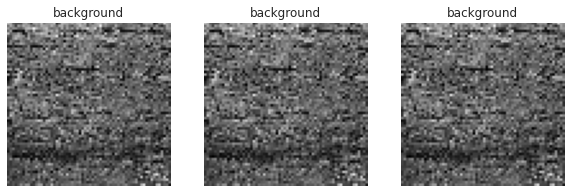

In [ ]:
for i in range(len(y_test1)):
  f,(ax1,ax2,ax3) = plt.subplots(1,3,figsize=(10,3))
  img = test_images[i]
  rgb = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

  ax1.imshow(rgb)
  ax1.set_title(y_test1[i])
  ax1.set_axis_off()

  ax2.imshow(rgb)
  ax2.set_title(y_test2[i])
  ax2.set_axis_off()

  ax3.imshow(rgb)
  ax3.set_title(y_test3[i])
  ax3.set_axis_off()


### making json file for results

In [ ]:
res = results(test_image_list, y_test3)

### saving results in json

In [ ]:
import json
def write_json(file):
    jsonString = json.dumps(file)
    jsonFile = open("outputs/output1.json", "w")
    jsonFile.write(jsonString)
    jsonFile.close()
    
write_json(res)

###    ---------------------------Thanks to all for going through my notebook------------------------------